In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/nasa-nearest-earth-objects/neo_v2.csv
/kaggle/input/nasa-nearest-earth-objects/neo.csv


In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [3]:
from sklearnex import patch_sklearn 
patch_sklearn()
# For faster processing using intel library.

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


I will be using seaborn, matplotlib and plotly to chart diagrams and graphs. Would be mainly using plotly though, as it is more interactive.

Lets import the data

In [4]:
df = pd.read_csv("../input/nasa-nearest-earth-objects/neo.csv")

In [5]:
df.head(20)

,id,name,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,orbiting_body,sentry_object,absolute_magnitude,hazardous
0,2162635,162635 (2000 SS164),1.198271,2.679415,13569.249224,5.483974e+07,Earth,False,16.73,False
1,2277475,277475 (2005 WK4),0.265800,0.594347,73588.726663,6.143813e+07,Earth,False,20.00,True
2,2512244,512244 (2015 YE18),0.722030,1.614507,114258.692129,4.979872e+07,Earth,False,17.83,False
3,3596030,(2012 BV13),0.096506,0.215794,24764.303138,2.543497e+07,Earth,False,22.20,False
4,3667127,(2014 GE35),0.255009,0.570217,42737.733765,4.627557e+07,Earth,False,20.09,True
5,54138696,(2021 GY23),0.036354,0.081291,34297.587778,4.058569e+07,Earth,False,24.32,False
6,54189957,(2021 PY40),0.171615,0.383743,27529.472307,2.906912e+07,Earth,False,20.95,False
7,54230078,(2021 XD6),0.005328,0.011914,57544.470083,5.511502e+07,Earth,False,28.49,False
8,2088213,88213 (2001 AF2),0.350393,0.783502,56625.210122,6.903598e+07,Earth,False,19.40,False
9,3766065,(2016 YM),0.105817,0.236614,48425.840329,3.835526e+07,Earth,False,22.00,False


The parameter sentry object is false for every item in the data, thus it will have no dependency on the model. Thus is is better to drop it.

In [6]:
df = df.drop('sentry_object',axis=1)
df = df.drop('orbiting_body',axis=1)
df = df.drop('name',axis=1)

In [7]:
df

,id,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
0,2162635,1.198271,2.679415,13569.249224,5.483974e+07,16.73,False
1,2277475,0.265800,0.594347,73588.726663,6.143813e+07,20.00,True
2,2512244,0.722030,1.614507,114258.692129,4.979872e+07,17.83,False
3,3596030,0.096506,0.215794,24764.303138,2.543497e+07,22.20,False
4,3667127,0.255009,0.570217,42737.733765,4.627557e+07,20.09,True
...,...,...,...,...,...,...,...
90831,3763337,0.026580,0.059435,52078.886692,1.230039e+07,25.00,False
90832,3837603,0.016771,0.037501,46114.605073,5.432121e+07,26.00,False
90833,54017201,0.031956,0.071456,7566.807732,2.840077e+07,24.60,False
90834,54115824,0.007321,0.016370,69199.154484,6.869206e+07,27.80,False


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90836 entries, 0 to 90835
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  90836 non-null  int64  
 1   est_diameter_min    90836 non-null  float64
 2   est_diameter_max    90836 non-null  float64
 3   relative_velocity   90836 non-null  float64
 4   miss_distance       90836 non-null  float64
 5   absolute_magnitude  90836 non-null  float64
 6   hazardous           90836 non-null  bool   
dtypes: bool(1), float64(5), int64(1)
memory usage: 4.2 MB


Feature Engineering

In [9]:
# More features such as Mass, Volume and Impact Energy are found to have an effect on decision making process whether a Near OBject Earth os haxardous or  not
# Refernce
# The near-Earth objects and their potential threat 
# DOI 10.1007/s00159-013-0065-4

df['Mass'] = df.loc[:, 'absolute_magnitude'] ** (1/4)
df['avg_radius'] = (df.loc[:, 'est_diameter_min'] + df.loc[:,'est_diameter_max'])/2
df['Volume'] = (df.loc[:, 'avg_radius'] ** 3)*1.33
df['energy'] = (df.loc[:, 'Mass'] * df.loc[:, 'relative_velocity']**2)*0.5

<AxesSubplot:>

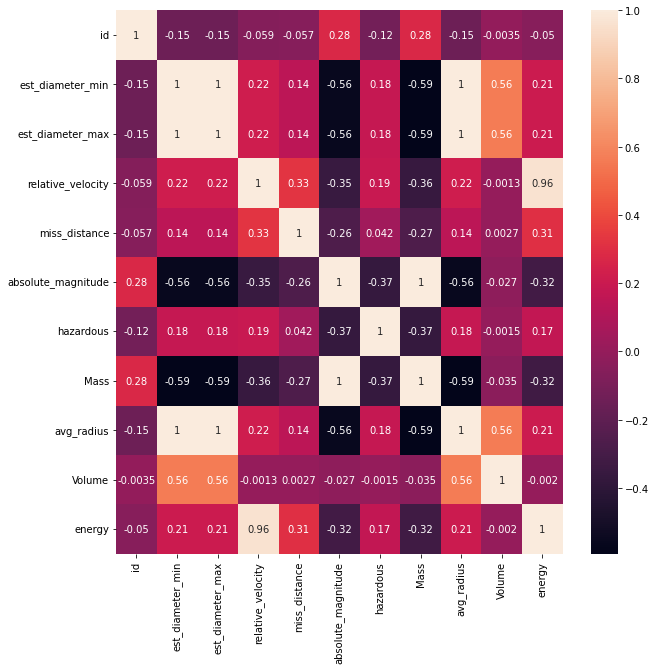

In [10]:
plt.figure(figsize=(10,10))
sns.heatmap(df.corr(),annot=True)

In [14]:
fig = px.scatter(df, y="relative_velocity", x="miss_distance", color="hazardous", size = 'Mass',
                   hover_data=df.columns, template = 'plotly_dark',
                 title = 'Velocity and Miss Distance of Hazardous Objects with min diameter of object')
fig.show()

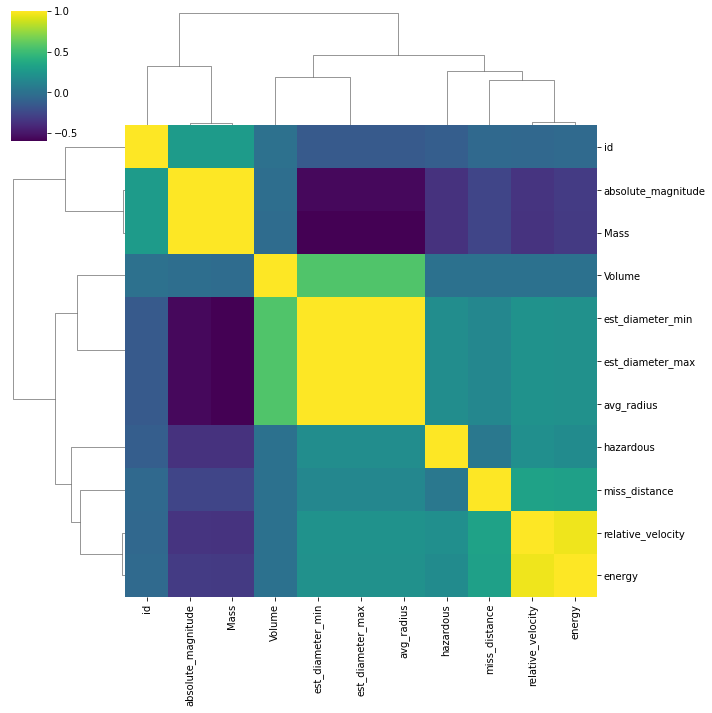

In [26]:
sns.clustermap(df.corr(),cmap='viridis')

<AxesSubplot:>

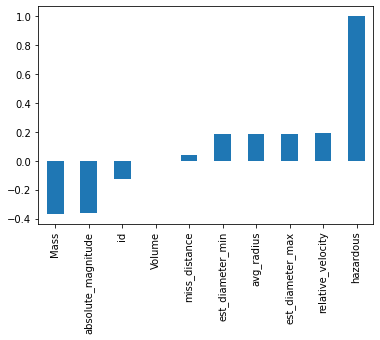

In [12]:
df.corr()['hazardous']
df.corr()['hazardous'][:-1].sort_values().plot(kind='bar')

In [16]:
X = df.drop('hazardous',axis = 1)
y = df['hazardous']

In [17]:
X

,id,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,Mass,avg_radius,Volume,energy
0,2162635,1.198271,2.679415,13569.249224,5.483974e+07,16.73,2.022432,1.938843,9.693475,1.861897e+08
1,2277475,0.265800,0.594347,73588.726663,6.143813e+07,20.00,2.114743,0.430073,0.105798,5.725983e+09
2,2512244,0.722030,1.614507,114258.692129,4.979872e+07,17.83,2.054886,1.168268,2.120701,1.341332e+10
3,3596030,0.096506,0.215794,24764.303138,2.543497e+07,22.20,2.170642,0.156150,0.005064,6.655956e+08
4,3667127,0.255009,0.570217,42737.733765,4.627557e+07,20.09,2.117118,0.412613,0.093429,1.933472e+09
...,...,...,...,...,...,...,...,...,...,...
90831,3763337,0.026580,0.059435,52078.886692,1.230039e+07,25.00,2.236068,0.043007,0.000106,3.032343e+09
90832,3837603,0.016771,0.037501,46114.605073,5.432121e+07,26.00,2.258101,0.027136,0.000027,2.400990e+09
90833,54017201,0.031956,0.071456,7566.807732,2.840077e+07,24.60,2.227070,0.051706,0.000184,6.375719e+07
90834,54115824,0.007321,0.016370,69199.154484,6.869206e+07,27.80,2.296208,0.011845,0.000002,5.497722e+09


I am going to use Grid Search for findding out the best parameters in SVM. Preparing the train test split

In [18]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3)

Scaling the data

In [19]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)

In [20]:
from sklearn.svm import SVC

In [21]:
svc = SVC(class_weight='balanced',verbose=True)

In [22]:
from sklearn.model_selection import GridSearchCV

In [23]:
C_range = np.logspace(-2, 10, 13)
gamma_range = np.logspace(-9, 3, 13)

In [24]:
C_range

array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05,
       1.e+06, 1.e+07, 1.e+08, 1.e+09, 1.e+10])

In [29]:
param_grid = {'C':[1,10,100],
              'gamma':['scale','auto'],
              'kernel':['linear']
             }
grid = GridSearchCV(svc,param_grid)
grid.fit(scaled_X_train,y_train)
grid.best_params_

{'C': 1, 'gamma': 'scale', 'kernel': 'linear'}

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of

              precision    recall  f1-score   support

       False       0.90      1.00      0.95     24651
        True       0.00      0.00      0.00      2600

    accuracy                           0.90     27251
   macro avg       0.45      0.50      0.47     27251
weighted avg       0.82      0.90      0.86     27251



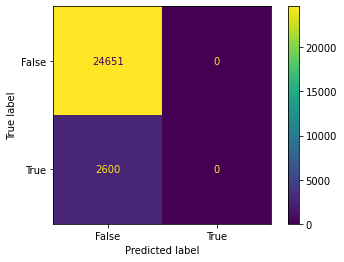

In [30]:
from sklearn.metrics import confusion_matrix,classification_report,plot_confusion_matrix
grid_pred = grid.predict(scaled_X_test)
confusion_matrix(y_test,grid_pred)
print(classification_report(y_test,grid_pred))
plot_confusion_matrix(grid,scaled_X_test,y_test)

In [32]:
param_grid = {'C':[1,10,100],
              'gamma':['scale','auto'],
              'kernel':['rbf']
             }
grid = GridSearchCV(svc,param_grid)
grid.fit(scaled_X_train,y_train)
grid.best_params_

{'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of

              precision    recall  f1-score   support

       False       0.90      1.00      0.95     24651
        True       0.00      0.00      0.00      2600

    accuracy                           0.90     27251
   macro avg       0.45      0.50      0.47     27251
weighted avg       0.82      0.90      0.86     27251



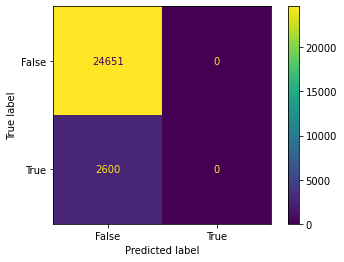

In [31]:
from sklearn.metrics import confusion_matrix,classification_report,plot_confusion_matrix
grid_pred = grid.predict(scaled_X_test)
confusion_matrix(y_test,grid_pred)
print(classification_report(y_test,grid_pred))
plot_confusion_matrix(grid,scaled_X_test,y_test)

In [ ]:
param_grid = {'C':[1,10,100],
              'gamma':['scale','auto'],
              'kernel':['poly'],
              'degree':[1,2,3]
             }
grid = GridSearchCV(svc,param_grid)
grid.fit(scaled_X_train,y_train)
grid.best_params_

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,plot_confusion_matrix
grid_pred = grid.predict(scaled_X_test)
confusion_matrix(y_test,grid_pred)
print(classification_report(y_test,grid_pred))
plot_confusion_matrix(grid,scaled_X_test,y_test)

In [ ]:
param_grid = {'C':[1,10,100],
              'gamma':['scale','auto'],
              'kernel':['sigmoid'],
              'degree':[1,2,3]
             }
grid = GridSearchCV(svc,param_grid)
grid.fit(scaled_X_train,y_train)
grid.best_params_

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,plot_confusion_matrix
grid_pred = grid.predict(scaled_X_test)
confusion_matrix(y_test,grid_pred)
print(classification_report(y_test,grid_pred))
plot_confusion_matrix(grid,scaled_X_test,y_test)